In [1]:
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.preprocessing.image import img_to_array, load_img
import geopandas as gpd
from shapely.geometry import Point

2024-07-29 21:32:08.097365: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-29 21:32:08.276225: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-29 21:32:08.277575: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1442] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-29 21:32:08.552100: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# CONSTANTS
IMG_WIDTH = 256
IMG_HEIGHT = 256

## Reading csv

In [3]:
df = pd.read_csv('calculated_scores_saved_images.csv')
df.head()

,id,confidenceScore,imageUrl,imageFile,safetyScore,calculatedScores,coordinates,city
0,7GHovlsf44dzEVhkqf6L,"['5', '4', '5', '4', '4']",https://storage.googleapis.com/crowdsourcing-4...,dataset/base/0.jpg,"['3', '4', '1', '4', '4']",4.52,"121.035513, 14.445193",paranaque
1,dPKmmGtY8XFiqqL076tB,"['4', '4', '4', '4', '5']",https://storage.googleapis.com/crowdsourcing-4...,dataset/base/1.jpg,"['4', '2', '3', '3', '5']",4.72,"121.034358, 14.446653",paranaque
2,cvveGLFZv8im8szkCij1,"['4', '2', '3', '5', '3']",https://storage.googleapis.com/crowdsourcing-4...,dataset/base/2.jpg,"['4', '4', '3', '3', '4']",4.86,"121.033166, 14.448051",paranaque
3,q8a4eGfojrPWCUOsqwJ9,"['2', '4', '4', '4', '3']",https://storage.googleapis.com/crowdsourcing-4...,dataset/base/3.jpg,"['2', '3', '2', '2', '3']",2.43,"121.04462, 14.454739",paranaque
4,Jc2KtS5yhgxYhcFZ1tbx,"['3', '4', '1', '5', '4']",https://storage.googleapis.com/crowdsourcing-4...,dataset/base/4.jpg,"['4', '3', '2', '2', '1']",2.58,"121.041713, 14.454986",paranaque


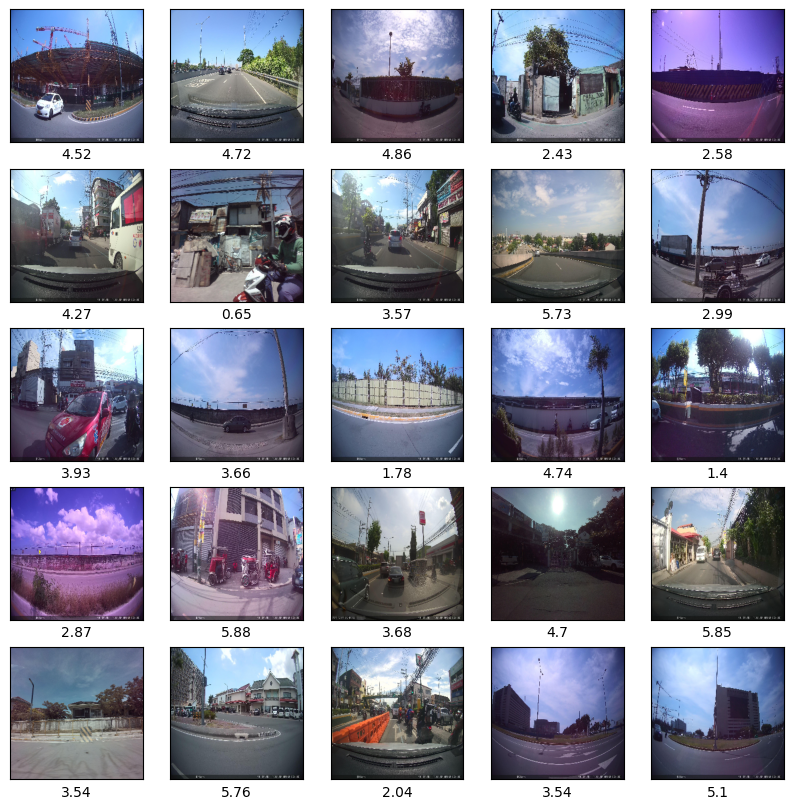

In [4]:
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    img = load_img(df['imageFile'].iloc[i], target_size=(IMG_WIDTH, IMG_HEIGHT))
    
    plt.imshow(img)
    # The CIFAR labels happen to be arrays, 
    # which is why you need the extra index
    plt.xlabel(df['calculatedScores'].iloc[i])
plt.show()

In [5]:
# # whole sample
# plt.figure(figsize=(10, 140))
# for i in range(len(df)):
#     plt.subplot(int(len(df)/5),5,i+1)
#     plt.xticks([])
#     plt.yticks([])
#     plt.grid(False)
#     img = load_img(df['imageFile'].iloc[i], target_size=(256, 256))
#     plt.imshow(img)
#     # The CIFAR labels happen to be arrays, 
#     # which is why you need the extra index
#     plt.xlabel(df['calculatedScores'].iloc[i])
# plt.show()

## Loading map

In [6]:
philippines = gpd.read_file('maps/phl_admbnda_adm4_psa_namria_20231106.zip')

<Axes: >

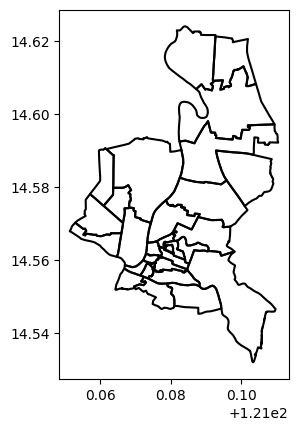

In [7]:
pasig = philippines[philippines['ADM3_EN'] == 'City of Pasig']
pasig.boundary.plot(edgecolor='black')

<Axes: >

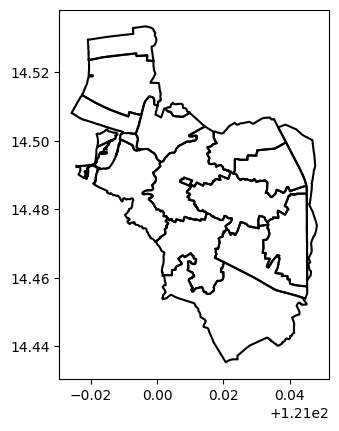

In [8]:
paranaque = philippines[philippines['ADM3_EN'] == 'City of Parañaque']
paranaque.boundary.plot(edgecolor='black')

In [9]:
df[['x', 'y']] = df['coordinates'].str.split(', ', expand=True)

In [10]:
geometry = gpd.points_from_xy(df['x'], df['y'], crs="EPSG:4326")
street_points = gpd.GeoDataFrame(geometry=geometry)  
street_points['calculatedScores'] = df['calculatedScores']
street_points['city'] = df['city']
street_points

,geometry,calculatedScores,city
0,POINT (121.03551 14.44519),4.52,paranaque
1,POINT (121.03436 14.44665),4.72,paranaque
2,POINT (121.03317 14.44805),4.86,paranaque
3,POINT (121.04462 14.45474),2.43,paranaque
4,POINT (121.04171 14.45499),2.58,paranaque
...,...,...,...
480,POINT (121.09123 14.60484),4.78,pasig
481,POINT (121.09215 14.60751),3.98,pasig
482,POINT (121.09211 14.61019),6.16,pasig
483,POINT (121.0921 14.61255),3.01,pasig


In [11]:
street_points_pasig = street_points[street_points['city'] == 'pasig']
street_points_paranaque = street_points[street_points['city'] == 'paranaque']

In [12]:
street_points_paranaque

,geometry,calculatedScores,city
0,POINT (121.03551 14.44519),4.52,paranaque
1,POINT (121.03436 14.44665),4.72,paranaque
2,POINT (121.03317 14.44805),4.86,paranaque
3,POINT (121.04462 14.45474),2.43,paranaque
4,POINT (121.04171 14.45499),2.58,paranaque
...,...,...,...
228,POINT (121.01261 14.50291),4.36,paranaque
229,POINT (121.00823 14.50733),3.78,paranaque
230,POINT (121.00275 14.50796),3.19,paranaque
231,POINT (120.99729 14.50851),2.91,paranaque


## EDA

In [13]:
street_points['calculatedScores'].describe()

count    485.000000
mean       3.684907
std        1.415342
min        0.460000
25%        2.690000
50%        3.720000
75%        4.730000
max        6.970000
Name: calculatedScores, dtype: float64

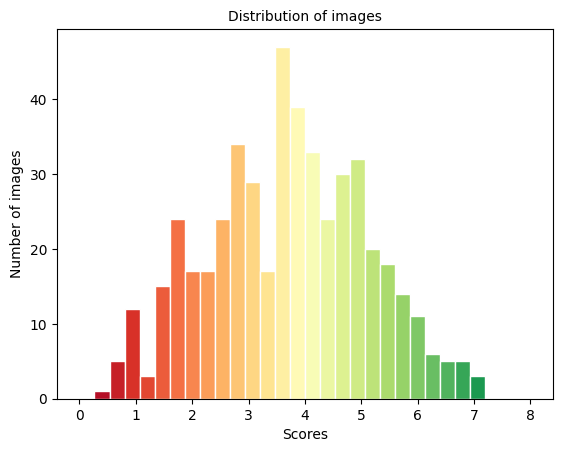

In [14]:
n, bins, patches = plt.hist(df['calculatedScores'], bins=30, range=(0, 8), edgecolor='white')

# n = n.astype('int') # it MUST be integer
# Good old loop. Choose colormap of your taste
for i in range(len(patches)):
    patches[i].set_facecolor(plt.cm.RdYlGn(i / (len(patches) - 1)))

plt.title('Distribution of images', fontsize=10)
plt.xlabel('Scores', fontsize=10)
plt.ylabel('Number of images', fontsize=10)
plt.show()

<Axes: >

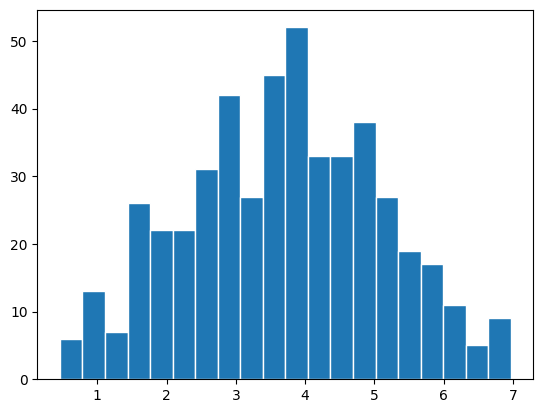

In [15]:
df['calculatedScores'].hist(edgecolor='white', bins=20, grid=False)

In [16]:
df.sort_values(by=['calculatedScores'], ascending=False)

,id,confidenceScore,imageUrl,imageFile,safetyScore,calculatedScores,coordinates,city,x,y
458,4ESrYm8TONeHGI7RfVzb,"['4', '5', '5', '4', '4']",https://storage.googleapis.com/crowdsourcing-4...,dataset/base/458.jpg,"['4', '5', '5', '5', '4']",6.97,"121.091312, 14.587645",pasig,121.091312,14.587645
101,p2MPAsEhP54zH758gZja,"['4', '4', '5', '5', '4']",https://storage.googleapis.com/crowdsourcing-4...,dataset/base/101.jpg,"['5', '5', '4', '5', '4']",6.94,"121.022367, 14.488383",paranaque,121.022367,14.488383
47,e5ltEpY4yKCrC0ToM0Eb,"['4', '4', '4', '5', '5']",https://storage.googleapis.com/crowdsourcing-4...,dataset/base/47.jpg,"['4', '5', '5', '4', '5']",6.94,"121.026526, 14.446633",paranaque,121.026526,14.446633
61,bQCLbtb1JR0Ih55D9bpA,"['5', '3', '5', '4', '4']",https://storage.googleapis.com/crowdsourcing-4...,dataset/base/61.jpg,"['5', '4', '5', '5', '4']",6.85,"121.026134, 14.461696",paranaque,121.026134,14.461696
295,eUGhUZbIDQDOAfxtys1l,"['4', '4', '4', '5', '4']",https://storage.googleapis.com/crowdsourcing-4...,dataset/base/295.jpg,"['5', '5', '4', '5', '4']",6.82,"121.094054, 14.56275",pasig,121.094054,14.56275
...,...,...,...,...,...,...,...,...,...,...
371,LPqYbHe4ZwprR6ea87PT,"['4', '5', '4', '5', '4']",https://storage.googleapis.com/crowdsourcing-4...,dataset/base/371.jpg,"['2', '2', '1', '1', '1']",0.68,"121.093492, 14.578352",pasig,121.093492,14.578352
6,Ir9BNWTwSVnC0Egj7KGN,"['5', '4', '5', '4', '5']",https://storage.googleapis.com/crowdsourcing-4...,dataset/base/6.jpg,"['1', '2', '1', '1', '2']",0.65,"121.037521, 14.456044",paranaque,121.037521,14.456044
439,kiWe3ArFL6O0YMQ8Lhjo,"['5', '4', '4', '5', '5']",https://storage.googleapis.com/crowdsourcing-4...,dataset/base/439.jpg,"['1', '1', '2', '1', '2']",0.65,"121.104125, 14.608404",pasig,121.104125,14.608404
93,UfhOG8FhAk6wRLUYjZLw,"['5', '5', '4', '5', '4']",https://storage.googleapis.com/crowdsourcing-4...,dataset/base/93.jpg,"['1', '1', '1', '1', '2']",0.57,"121.018512, 14.490051",paranaque,121.018512,14.490051


In [17]:
top_df = df.sort_values(by=['calculatedScores'], ascending=False).reset_index()
bot_df = df.sort_values(by=['calculatedScores'], ascending=True).reset_index()
top_df = top_df.drop(columns=['index'])
bot_df = bot_df.drop(columns=['index'])

In [18]:
def load_image_from_url_cv2(url):
    img = cv2.imread(url)
    return img

### Highest and lowest rated images

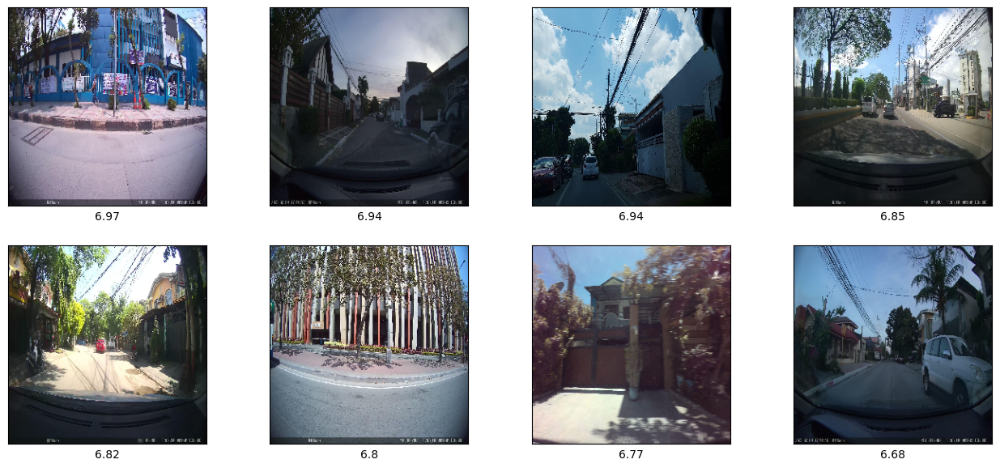

In [19]:
plt.figure(figsize=(16, 7))
for i in range(8):
    plt.subplot(2,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    img = load_img(top_df['imageFile'].iloc[i], target_size=(IMG_WIDTH, IMG_HEIGHT))
    
    plt.imshow(img)
    # The CIFAR labels happen to be arrays, 
    # which is why you need the extra index
    plt.xlabel(top_df['calculatedScores'].iloc[i])
plt.show()

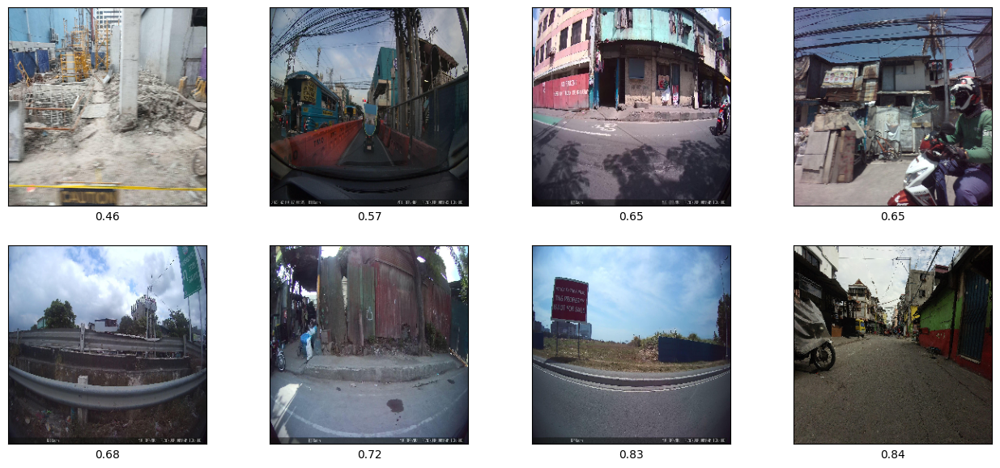

In [20]:
plt.figure(figsize=(16, 7))
for i in range(8):
    plt.subplot(2,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    img = load_img(bot_df['imageFile'].iloc[i], target_size=(IMG_WIDTH, IMG_HEIGHT))
    
    plt.imshow(img)
    # The CIFAR labels happen to be arrays, 
    # which is why you need the extra index
    plt.xlabel(bot_df['calculatedScores'].iloc[i])
plt.show()

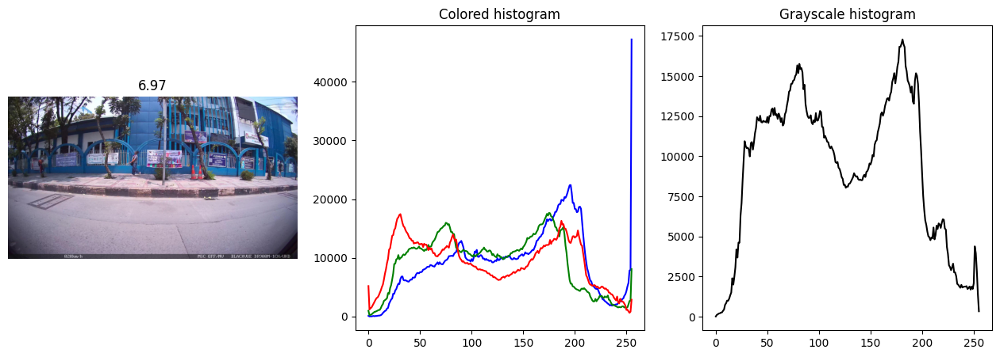

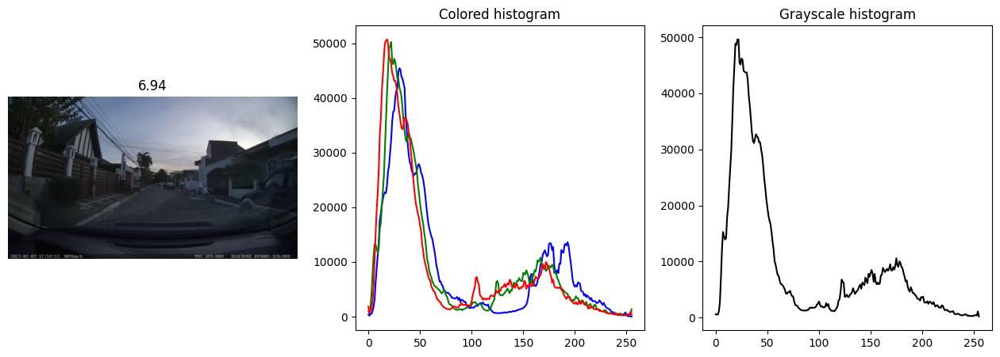

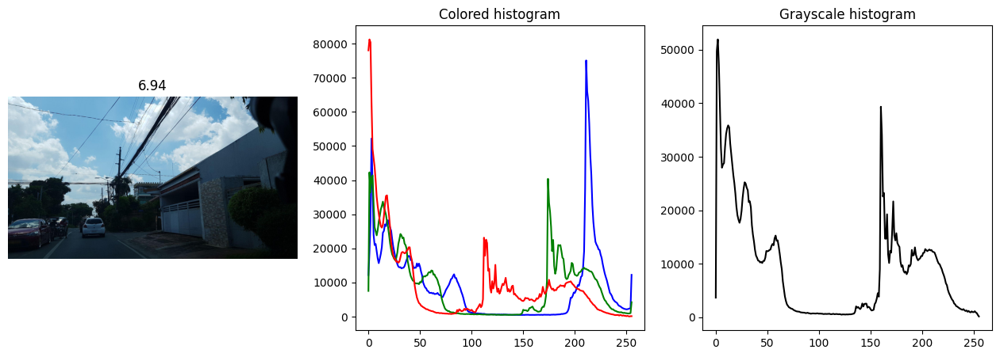

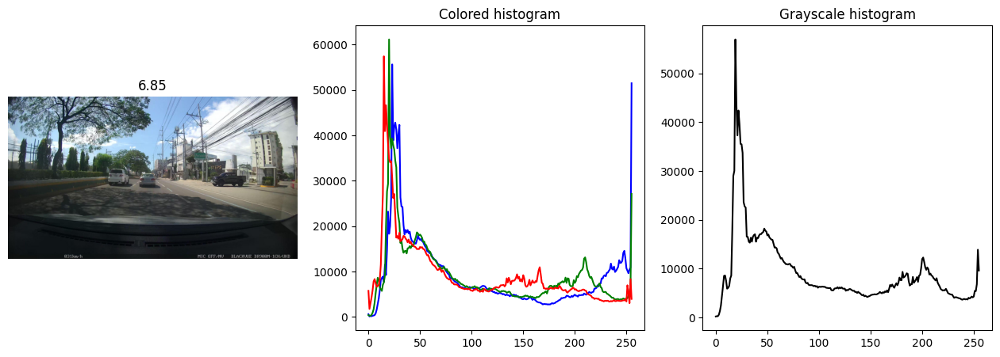

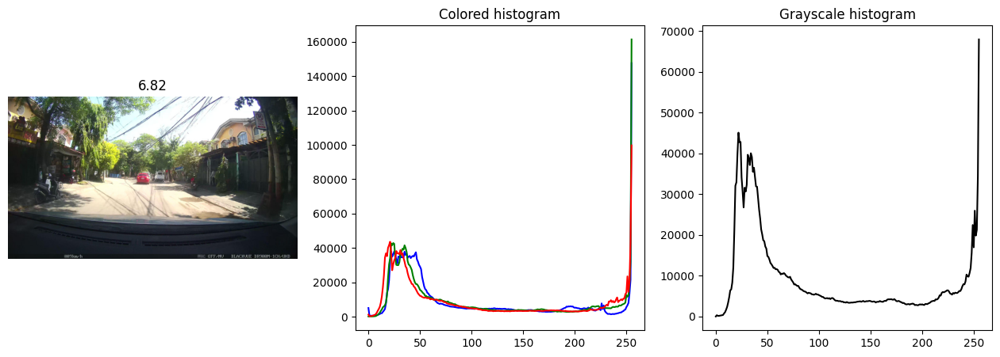

...

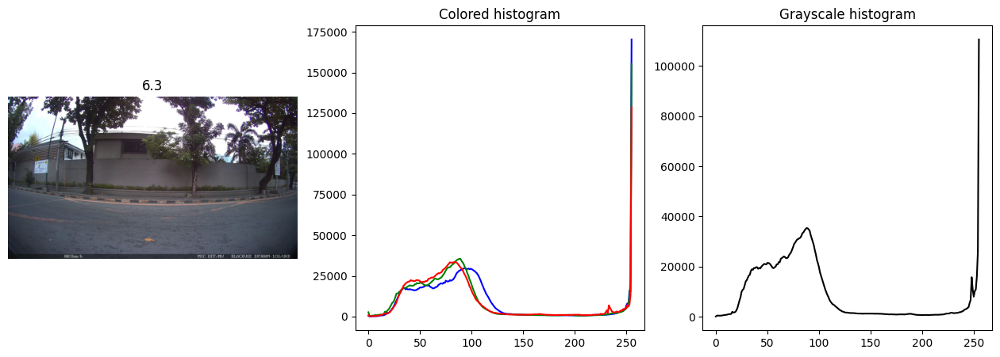

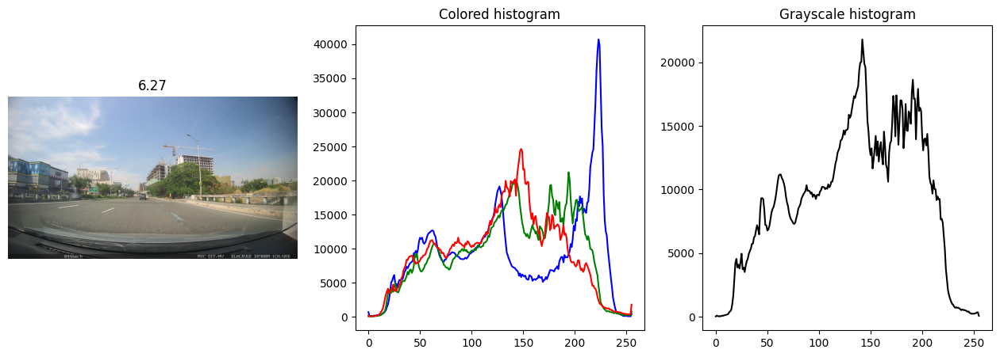

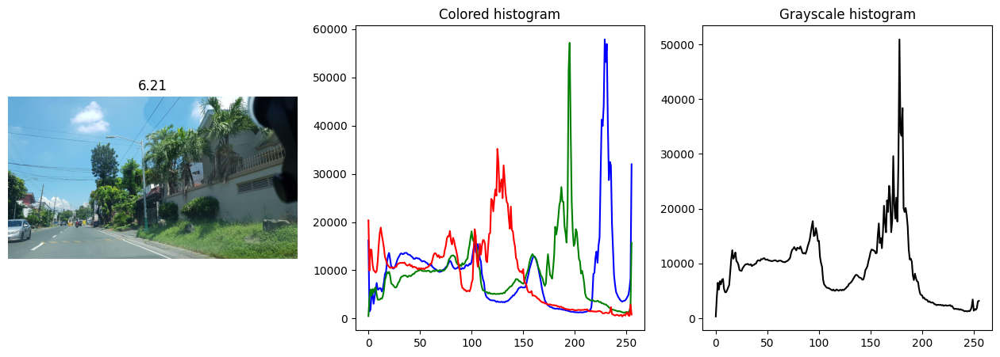

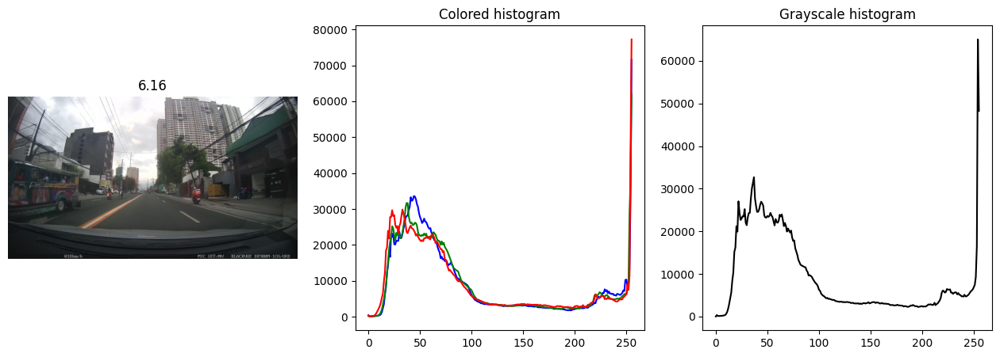

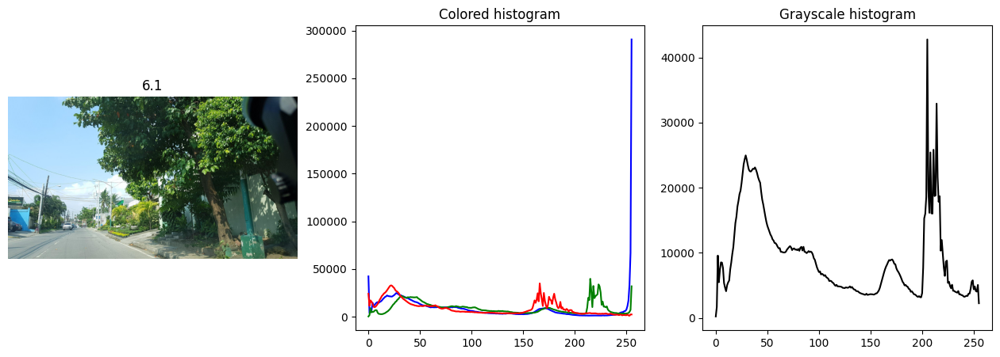

In [21]:
color = ('b','g','r')
for j in range(20):
    img = load_image_from_url_cv2(top_df['imageFile'].iloc[j])
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Create a figure with 1 row and 2 columns
    fig, ax = plt.subplots(1, 3, figsize=(16, 5))
    
    # Display the image in the first subplot
    ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax[0].axis('off')  # Hide the axis
    ax[0].set_title(top_df['calculatedScores'].iloc[j])
    
    # Display the histogram in the second subplot
    for i, col in enumerate(color):
        histr = cv2.calcHist([img], [i], None, [256], [0, 256])
        ax[1].plot(histr, color=col)

    ax[1].set_title('Colored histogram')
    grey_hist = cv2.calcHist([gray_img], [0], None, [256], [0, 256])
    ax[2].plot(grey_hist, color='k')
    ax[2].set_title('Grayscale histogram')

    # ax[1].set_ylim(0, 200000)
    # ax[2].set_ylim(0, 200000)
    # Display the combined figure
    plt.show()

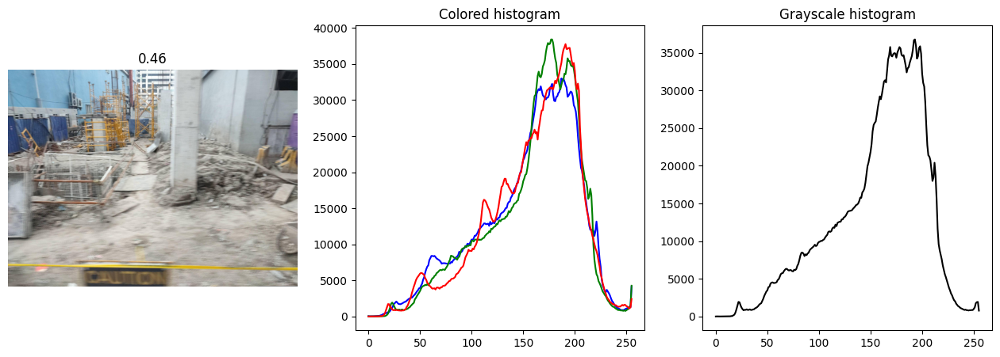

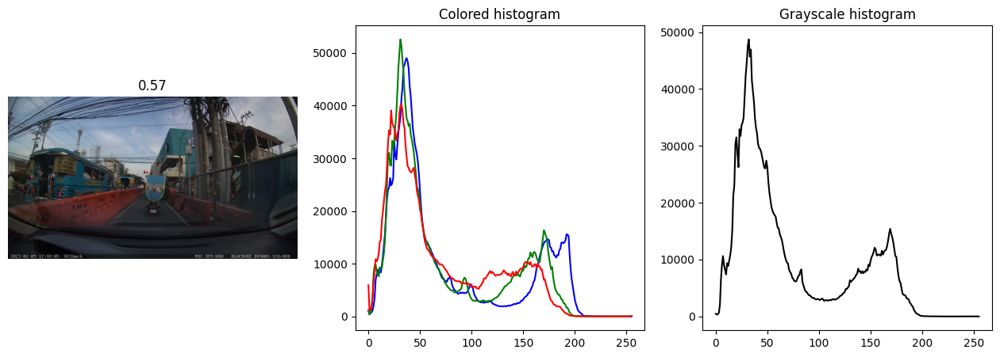

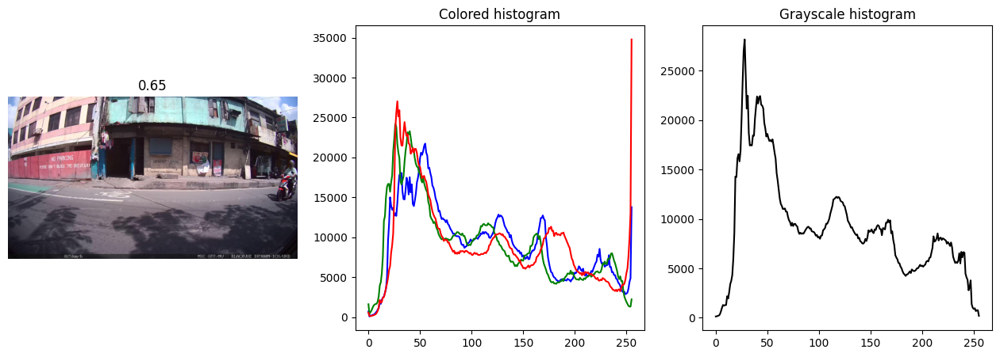

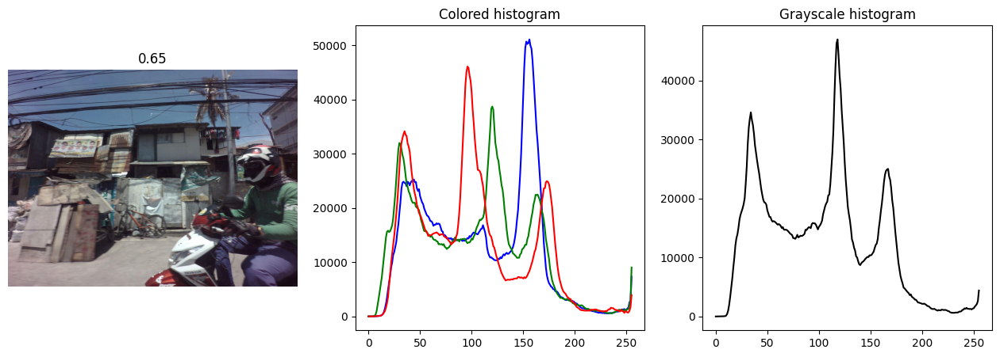

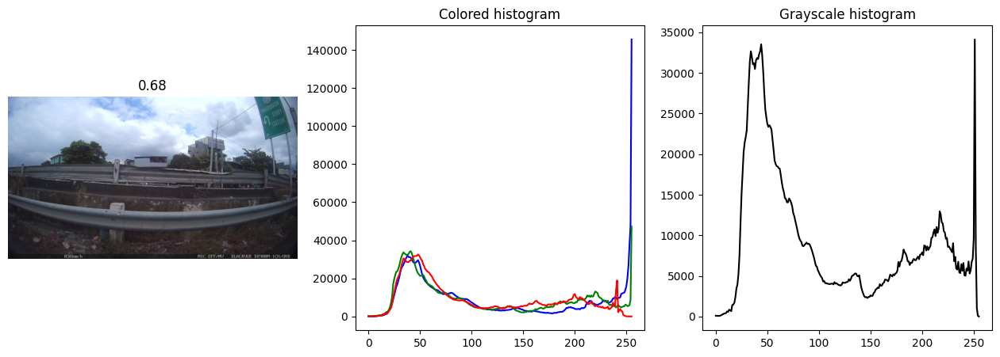

...

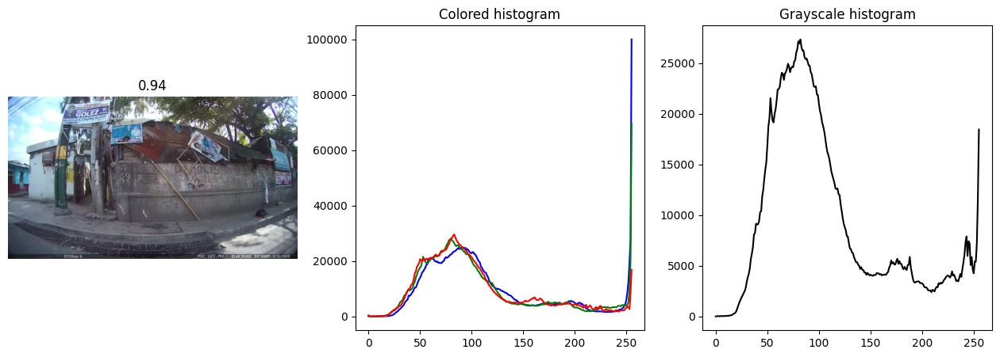

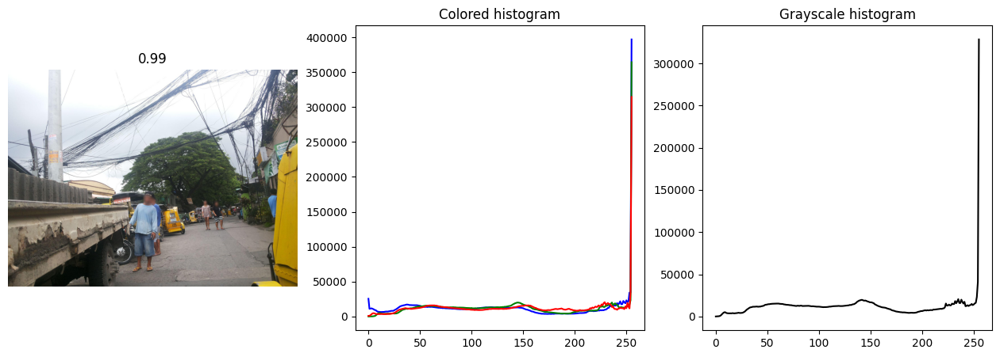

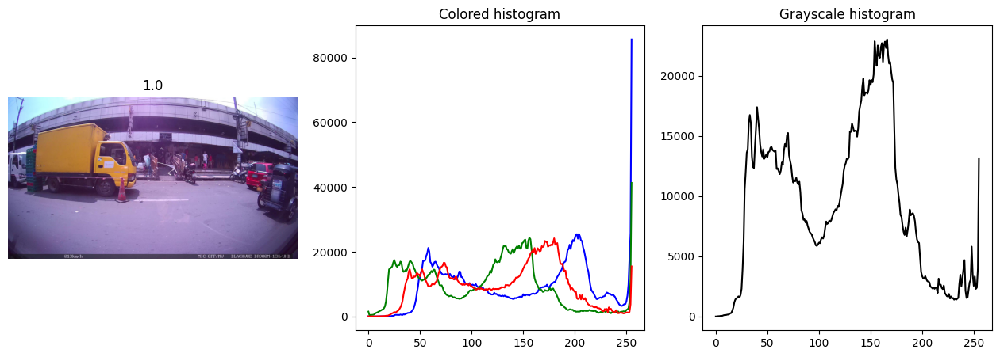

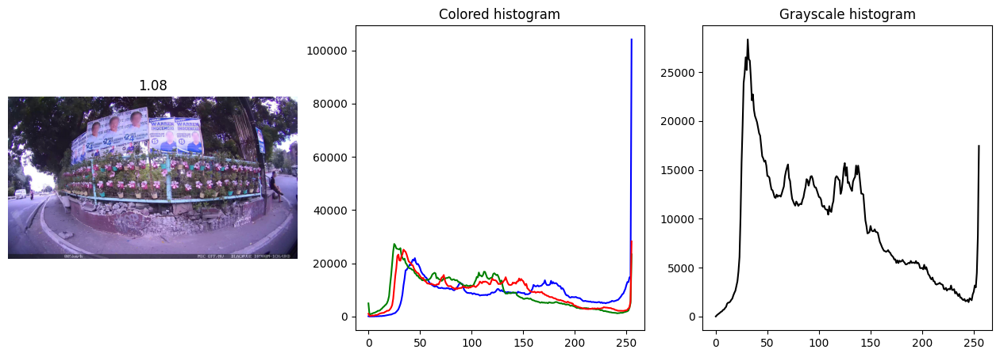

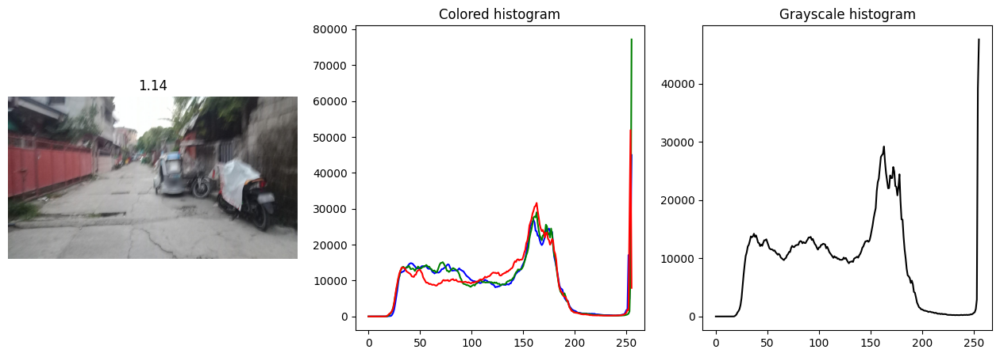

In [22]:
color = ('b','g','r')
for j in range(20):
    img = load_image_from_url_cv2(bot_df['imageFile'].iloc[j])
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Create a figure with 1 row and 2 columns
    fig, ax = plt.subplots(1, 3, figsize=(16, 5))
    
    # Display the image in the first subplot
    ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax[0].axis('off')  # Hide the axis
    ax[0].set_title(bot_df['calculatedScores'].iloc[j])
    
    # Display the histogram in the second subplot
    for i, col in enumerate(color):
        histr = cv2.calcHist([img], [i], None, [256], [0, 256])
        ax[1].plot(histr, color=col)

    ax[1].set_title('Colored histogram')
    grey_hist = cv2.calcHist([gray_img], [0], None, [256], [0, 256])
    ax[2].plot(grey_hist, color='k')
    ax[2].set_title('Grayscale histogram')

    # ax[1].set_ylim(0, 200000)
    # ax[2].set_ylim(0, 200000)
    # Display the combined figure
    plt.show()

In [23]:
# Function to load and preprocess images from URLs
def load_image_from_url(url):
    img = load_img(url, target_size=(IMG_WIDTH, IMG_HEIGHT))
    img_array = img_to_array(img)
    # img_array = np.copy(img)
    return img_array / 255.0  # Normalize pixel values to [0, 1]

In [24]:
# img = load_image_from_url(df['imageFile'].iloc[19])
# img_r = img[:,:,0]
# img_g = img[:,:,1]
# img_b = img[:,:,2]

### Image safety score distribution

<Axes: >

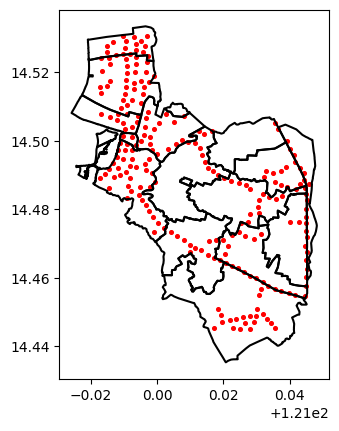

In [25]:
base = paranaque.boundary.plot(edgecolor='black')
street_points_paranaque.plot(ax=base, markersize=7, color='red')

<Axes: >

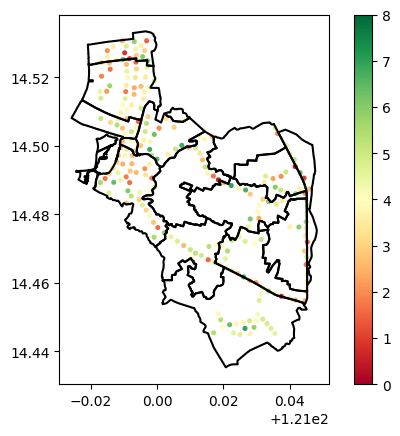

In [26]:
base = paranaque.boundary.plot(edgecolor='black')
street_points_paranaque.plot(ax=base, markersize=7, vmin=0, vmax=8, column=street_points_paranaque['calculatedScores'], cmap='RdYlGn', legend=True)

In [27]:
joined = gpd.sjoin(paranaque, street_points_paranaque, how='left', predicate='contains')
joined.head()

,ADM4_EN,ADM4_PCODE,ADM4_REF,ADM3_EN,ADM3_PCODE,ADM2_EN,ADM2_PCODE,ADM1_EN,ADM1_PCODE,ADM0_EN,...,date,validOn,validTo,Shape_Leng,Shape_Area,AREA_SQKM,geometry,index_right,calculatedScores,city
35242,Baclaran,PH1307604001,None,City of Parañaque,PH1307604,Metropolitan Manila Fourth District,PH13076,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.060561,0.000133,1.588166,"POLYGON ((120.99756 14.53322, 120.99802 14.533...",205,3.10,paranaque
35242,Baclaran,PH1307604001,None,City of Parañaque,PH1307604,Metropolitan Manila Fourth District,PH13076,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.060561,0.000133,1.588166,"POLYGON ((120.99756 14.53322, 120.99802 14.533...",219,3.95,paranaque
35242,Baclaran,PH1307604001,None,City of Parañaque,PH1307604,Metropolitan Manila Fourth District,PH13076,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.060561,0.000133,1.588166,"POLYGON ((120.99756 14.53322, 120.99802 14.533...",208,6.03,paranaque
35242,Baclaran,PH1307604001,None,City of Parañaque,PH1307604,Metropolitan Manila Fourth District,PH13076,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.060561,0.000133,1.588166,"POLYGON ((120.99756 14.53322, 120.99802 14.533...",211,0.91,paranaque
35242,Baclaran,PH1307604001,None,City of Parañaque,PH1307604,Metropolitan Manila Fourth District,PH13076,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.060561,0.000133,1.588166,"POLYGON ((120.99756 14.53322, 120.99802 14.533...",220,6.30,paranaque


In [28]:
# joined.shape

In [29]:
# paranaque.set_index('ADM4_EN', inplace=True)
# paranaque.head()

In [30]:
# paranaque['score_avg'] = joined.groupby('ADM4_EN')['calculatedScores'].mean().sort_values(ascending=False)
# paranaque.head()

In [31]:
# paranaque.plot(column='score_avg', vmin=0, vmax=8, cmap='RdYlGn', legend=True)

In [32]:
street_points_paranaque['calculatedScores'].describe()

count    233.000000
mean       3.848026
std        1.386669
min        0.460000
25%        2.810000
50%        3.810000
75%        4.800000
max        6.940000
Name: calculatedScores, dtype: float64

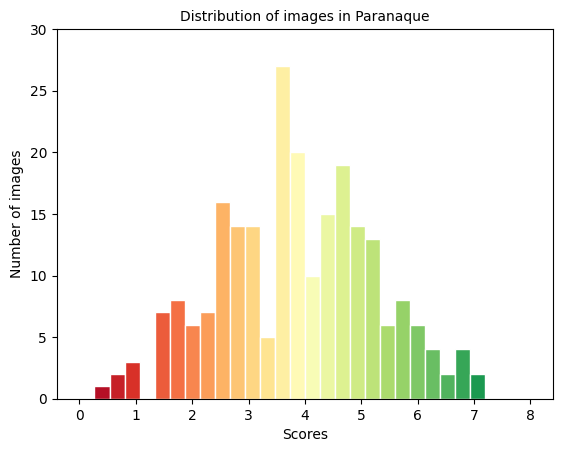

In [33]:
n, bins, patches = plt.hist(street_points_paranaque['calculatedScores'], bins=30, range=(0, 8), edgecolor='white')

# n = n.astype('int') # it MUST be integer
# Good old loop. Choose colormap of your taste
for i in range(len(patches)):
    patches[i].set_facecolor(plt.cm.RdYlGn(i / (len(patches) - 1)))

plt.title('Distribution of images in Paranaque', fontsize=10)
plt.xlabel('Scores', fontsize=10)
plt.ylabel('Number of images', fontsize=10)
plt.ylim(0, 30)
plt.show()

<Axes: >

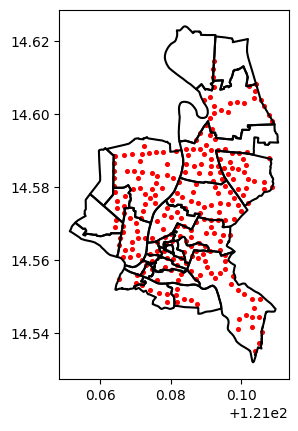

In [34]:
base = pasig.boundary.plot(edgecolor='black')
street_points_pasig.plot(ax=base, markersize=7, color='red')

<Axes: >

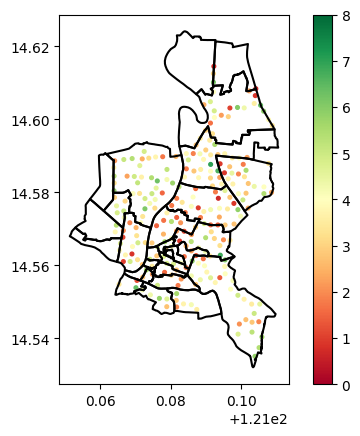

In [35]:
base = pasig.boundary.plot(edgecolor='black')
street_points_pasig.plot(ax=base, markersize=7, vmin=0, vmax=8, column=street_points_pasig['calculatedScores'], cmap='RdYlGn', legend=True)

In [36]:
street_points_pasig['calculatedScores'].describe()

count    252.000000
mean       3.534087
std        1.427549
min        0.650000
25%        2.475000
50%        3.590000
75%        4.607500
max        6.970000
Name: calculatedScores, dtype: float64

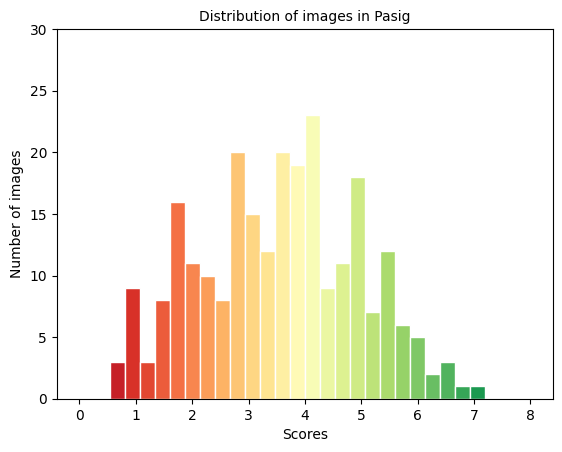

In [37]:
n, bins, patches = plt.hist(street_points_pasig['calculatedScores'], bins=30, range=(0, 8), edgecolor='white')

# n = n.astype('int') # it MUST be integer
# Good old loop. Choose colormap of your taste
for i in range(len(patches)):
    patches[i].set_facecolor(plt.cm.RdYlGn(i / (len(patches) - 1)))

plt.title('Distribution of images in Pasig', fontsize=10)
plt.xlabel('Scores', fontsize=10)
plt.ylabel('Number of images', fontsize=10)
plt.ylim(0, 30)
plt.show()

In [38]:
joined_paranaque = gpd.sjoin(paranaque, street_points, how='left', predicate='contains')
joined_paranaque.head()

,ADM4_EN,ADM4_PCODE,ADM4_REF,ADM3_EN,ADM3_PCODE,ADM2_EN,ADM2_PCODE,ADM1_EN,ADM1_PCODE,ADM0_EN,...,date,validOn,validTo,Shape_Leng,Shape_Area,AREA_SQKM,geometry,index_right,calculatedScores,city
35242,Baclaran,PH1307604001,None,City of Parañaque,PH1307604,Metropolitan Manila Fourth District,PH13076,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.060561,0.000133,1.588166,"POLYGON ((120.99756 14.53322, 120.99802 14.533...",205,3.10,paranaque
35242,Baclaran,PH1307604001,None,City of Parañaque,PH1307604,Metropolitan Manila Fourth District,PH13076,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.060561,0.000133,1.588166,"POLYGON ((120.99756 14.53322, 120.99802 14.533...",219,3.95,paranaque
35242,Baclaran,PH1307604001,None,City of Parañaque,PH1307604,Metropolitan Manila Fourth District,PH13076,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.060561,0.000133,1.588166,"POLYGON ((120.99756 14.53322, 120.99802 14.533...",220,6.30,paranaque
35242,Baclaran,PH1307604001,None,City of Parañaque,PH1307604,Metropolitan Manila Fourth District,PH13076,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.060561,0.000133,1.588166,"POLYGON ((120.99756 14.53322, 120.99802 14.533...",208,6.03,paranaque
35242,Baclaran,PH1307604001,None,City of Parañaque,PH1307604,Metropolitan Manila Fourth District,PH13076,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.060561,0.000133,1.588166,"POLYGON ((120.99756 14.53322, 120.99802 14.533...",212,5.94,paranaque


In [39]:
average_score = joined_paranaque.groupby('ADM4_EN')['calculatedScores'].mean().sort_values(ascending=False)
average_score

ADM4_EN
B. F. Homes              4.619583
Santo Niño               4.480625
San Isidro               4.226364
Don Bosco                4.160667
San Antonio              3.977500
Don Galo                 3.918889
Sun Valley               3.822500
Marcelo Green Village    3.802500
Vitalez                  3.780000
San Martin de Porres     3.721111
Baclaran                 3.590556
San Dionisio             3.547105
Tambo                    3.415806
Merville                 3.385000
Moonwalk                 3.311667
La Huerta                3.240000
Name: calculatedScores, dtype: float64

In [40]:
grouped = joined_paranaque.groupby('ADM4_EN')['geometry'].count().sort_values(ascending=True)
grouped

ADM4_EN
Vitalez                   1
Merville                  2
La Huerta                 3
Don Galo                  9
San Martin de Porres      9
San Isidro               11
Marcelo Green Village    12
Moonwalk                 12
Sun Valley               12
Don Bosco                15
Santo Niño               16
Baclaran                 18
San Antonio              20
B. F. Homes              24
Tambo                    31
San Dionisio             38
Name: geometry, dtype: int64

In [41]:
result_pq = joined_paranaque.groupby('ADM4_EN').agg(
    num_areas=('ADM4_EN', 'size'),
    mean_scores=('calculatedScores', 'mean'),
    std_scores = ('calculatedScores', 'std')
).reset_index().round(2)

# Filter groups where num_areas >= 5 and order by mean_scores
result_pq_atleast5 = result_pq[result_pq['num_areas'] >= 5].sort_values(by='mean_scores', ascending=False)
result_pq_atleast5

,ADM4_EN,num_areas,mean_scores,std_scores
0,B. F. Homes,24,4.62,0.97
12,Santo Niño,16,4.48,1.59
10,San Isidro,11,4.23,1.18
2,Don Bosco,15,4.16,1.59
8,San Antonio,20,3.98,1.35
3,Don Galo,9,3.92,1.27
13,Sun Valley,12,3.82,1.64
5,Marcelo Green Village,12,3.80,1.16
11,San Martin de Porres,9,3.72,1.80
1,Baclaran,18,3.59,1.72


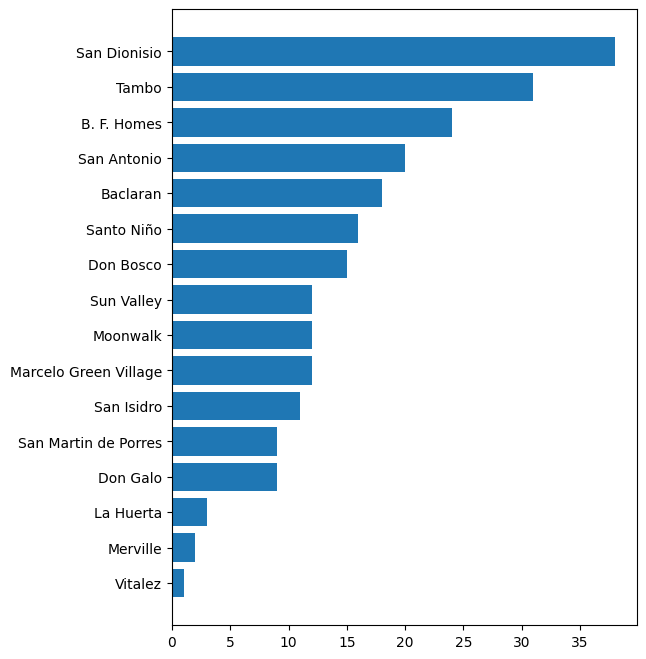

In [42]:
sorted_result_pq = result_pq.sort_values(by=['num_areas'], ascending=True)
plt.figure(figsize=(6,8))
plt.barh(sorted_result_pq['ADM4_EN'], sorted_result_pq['num_areas'])
plt.show()

In [61]:
paranaque.groupby('ADM4_EN').size()

ADM4_EN
B. F. Homes              1
Baclaran                 1
Don Bosco                1
Don Galo                 1
La Huerta                1
Marcelo Green Village    1
Merville                 1
Moonwalk                 1
San Antonio              1
San Dionisio             1
San Isidro               1
San Martin de Porres     1
Santo Niño               1
Sun Valley               1
Tambo                    1
Vitalez                  1
dtype: int64

In [73]:
joined_paranaque.groupby('ADM4_EN').size()

ADM4_EN
B. F. Homes              24
Baclaran                 18
Don Bosco                15
Don Galo                  9
La Huerta                 3
Marcelo Green Village    12
Merville                  2
Moonwalk                 12
San Antonio              20
San Dionisio             38
San Isidro               11
San Martin de Porres      9
Santo Niño               16
Sun Valley               12
Tambo                    31
Vitalez                   1
dtype: int64

In [43]:
result_pq['num_areas'].describe()

count    16.00000
mean     14.56250
std      10.07286
min       1.00000
25%       9.00000
50%      12.00000
75%      18.50000
max      38.00000
Name: num_areas, dtype: float64

In [44]:
joined_pasig = gpd.sjoin(pasig, street_points, how='left', predicate='contains')
joined_pasig.head()

,ADM4_EN,ADM4_PCODE,ADM4_REF,ADM3_EN,ADM3_PCODE,ADM2_EN,ADM2_PCODE,ADM1_EN,ADM1_PCODE,ADM0_EN,...,date,validOn,validTo,Shape_Leng,Shape_Area,AREA_SQKM,geometry,index_right,calculatedScores,city
34727,Bagong Ilog,PH1307403001,None,City of Pasig,PH1307403,Metropolitan Manila Second District,PH13074,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.044006,0.000102,1.212769,"POLYGON ((121.06826 14.57439, 121.0683 14.5743...",251.0,2.78,pasig
34727,Bagong Ilog,PH1307403001,None,City of Pasig,PH1307403,Metropolitan Manila Second District,PH13074,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.044006,0.000102,1.212769,"POLYGON ((121.06826 14.57439, 121.0683 14.5743...",247.0,0.99,pasig
34727,Bagong Ilog,PH1307403001,None,City of Pasig,PH1307403,Metropolitan Manila Second District,PH13074,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.044006,0.000102,1.212769,"POLYGON ((121.06826 14.57439, 121.0683 14.5743...",248.0,4.92,pasig
34727,Bagong Ilog,PH1307403001,None,City of Pasig,PH1307403,Metropolitan Manila Second District,PH13074,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.044006,0.000102,1.212769,"POLYGON ((121.06826 14.57439, 121.0683 14.5743...",252.0,3.28,pasig
34727,Bagong Ilog,PH1307403001,None,City of Pasig,PH1307403,Metropolitan Manila Second District,PH13074,National Capital Region (NCR),PH13,Philippines (the),...,2022-11-09,2023-11-06,0000/00/00,0.044006,0.000102,1.212769,"POLYGON ((121.06826 14.57439, 121.0683 14.5743...",259.0,3.74,pasig


In [45]:
average_score = joined_pasig.groupby('ADM4_EN')['calculatedScores'].mean().sort_values(ascending=False)
average_score

ADM4_EN
Pineda                4.600000
Kapitolyo             4.555000
Sagad                 4.555000
San Joaquin           4.387500
Ugong                 4.144571
Oranbo                4.093333
Pinagbuhatan          3.939032
Kapasigan             3.935000
Buting                3.817500
San Nicolas (Pob.)    3.756000
Rosario               3.643846
Kalawaan              3.640000
Manggahan             3.577895
San Jose              3.510000
Sumilang              3.476667
Santo Tomas           3.435000
San Miguel            3.376875
Santa Lucia           3.317273
Caniogan              3.070000
Dela Paz              3.020000
Bambang               2.920000
Bagong Ilog           2.876667
Maybunga              2.829231
Palatiw               2.650000
Malinao               2.315000
Santolan              1.865000
Bagong Katipunan           NaN
San Antonio                NaN
Santa Cruz                 NaN
Santa Rosa                 NaN
Name: calculatedScores, dtype: float64

<Axes: >

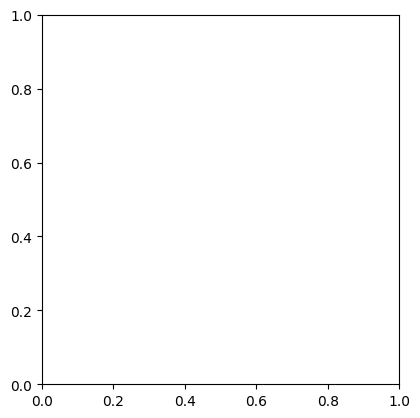

In [46]:
pasig.plot(average_score)

In [47]:
grouped = joined_pasig.groupby('ADM4_EN')['geometry'].count().sort_values(ascending=True)
grouped

ADM4_EN
Bagong Katipunan       1
Santa Rosa             1
Santa Cruz             1
San Jose               1
San Antonio            1
Pineda                 1
Santolan               2
Kapasigan              2
Kapitolyo              2
Malinao                2
Sagad                  2
Santo Tomas            2
Bambang                3
Dela Paz               3
Sumilang               3
San Joaquin            4
Palatiw                4
Buting                 4
San Nicolas (Pob.)     5
Oranbo                 6
Kalawaan               6
Caniogan              10
Bagong Ilog           15
San Miguel            16
Manggahan             19
Santa Lucia           22
Maybunga              26
Rosario               26
Pinagbuhatan          31
Ugong                 35
Name: geometry, dtype: int64

In [48]:
result_ps = joined_pasig.groupby('ADM4_EN').agg(
    num_areas=('ADM4_EN', 'size'),
    mean_scores=('calculatedScores', 'mean'),
    std_scores = ('calculatedScores', 'std')
).reset_index().round(2)

# Filter groups where num_areas >= 5 and order by mean_scores
result_ps_atleast5 = result_ps[result_ps['num_areas'] >= 5].sort_values(by='mean_scores', ascending=False)
result_ps_atleast5

,ADM4_EN,num_areas,mean_scores,std_scores
29,Ugong,35,4.14,1.27
12,Oranbo,6,4.09,0.89
14,Pinagbuhatan,31,3.94,1.34
22,San Nicolas (Pob.),5,3.76,1.44
6,Kalawaan,6,3.64,1.23
16,Rosario,26,3.64,1.26
10,Manggahan,19,3.58,1.60
21,San Miguel,16,3.38,1.61
24,Santa Lucia,22,3.32,1.29
4,Caniogan,10,3.07,1.54


In [49]:
result_ps['num_areas'].describe()

count    30.000000
mean      8.533333
std      10.139487
min       1.000000
25%       2.000000
50%       3.500000
75%      13.750000
max      35.000000
Name: num_areas, dtype: float64

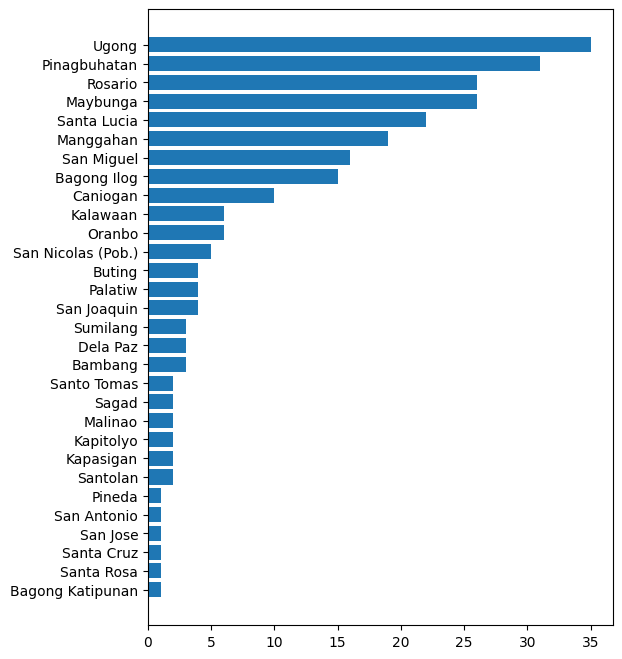

In [50]:
sorted_result_ps = result_ps.sort_values(by=['num_areas'], ascending=True)
plt.figure(figsize=(6,8))
plt.barh(sorted_result_ps['ADM4_EN'], sorted_result_ps['num_areas'])
plt.show()

In [81]:
joined_pasigjoined_pasig['calculatedScores'.isna()

ADM4_EN
Bagong Ilog           15
Bagong Katipunan       1
Bambang                3
Buting                 4
Caniogan              10
Dela Paz               3
Kalawaan               6
Kapasigan              2
Kapitolyo              2
Malinao                2
Manggahan             19
Maybunga              26
Oranbo                 6
Palatiw                4
Pinagbuhatan          31
Pineda                 1
Rosario               26
Sagad                  2
San Antonio            1
San Joaquin            4
San Jose               1
San Miguel            16
San Nicolas (Pob.)     5
Santa Cruz             1
Santa Lucia           22
Santa Rosa             1
Santo Tomas            2
Santolan               2
Sumilang               3
Ugong                 35
dtype: int64